# Introduction

This notebook has been created as part of the Music Generation project by Dmytro Lopushanskyy and Yana Muliarska.

The following sources have been used:

[How to utilize the Lakh MIDI Dataset, with examples](https://nbviewer.org/github/craffel/midi-dataset/blob/master/Tutorial.ipynb) 

[Generating Music Using Deep Learning](https://towardsdatascience.com/generating-music-using-deep-learning-cb5843a9d55e)  

[Using Deep Learning to generate pop music!](https://github.com/bearpelican/musicautobot)

[MusicGenDL](https://github.com/thamsuppp/MusicGenDL)

[The Lakh MIDI Dataset v0.1](https://colinraffel.com/projects/lmd/)

# Get the dataset

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!tar -xf "/content/drive/MyDrive/music_generation/lmd_matched_h5.tar.gz" -C "/content/"

In [3]:
!tar -xf "/content/drive/MyDrive/music_generation/lmd_matched.tar.gz" -C "/content/"

In [4]:
!tar -xf "/content/drive/MyDrive/music_generation/lpd_5_cleansed.tar.gz" -C "/content/"

# Install and import dependencies

In [5]:
!sudo apt install -y fluidsynth

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  fluid-soundfont-gm libfluidsynth1 libqt5x11extras5 qsynth
Suggested packages:
  fluid-soundfont-gs timidity jackd
The following NEW packages will be installed:
  fluid-soundfont-gm fluidsynth libfluidsynth1 libqt5x11extras5 qsynth
0 upgraded, 5 newly installed, 0 to remove and 41 not upgraded.
Need to get 120 MB of archives.
After this operation, 150 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 fluid-soundfont-gm all 3.1-5.1 [119 MB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libfluidsynth1 amd64 1.1.9-1 [137 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic/universe amd64 fluidsynth amd64 1.1.9-1 [20.7 kB]
Get:4 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libqt5x11extras5 amd64 5.9.5-0ubuntu1 [8,596 B]
Get:5 http://archive.ubuntu.com/ubuntu bionic/uni

In [6]:
!pip install --upgrade pyfluidsynth

In [7]:
!apt-get update -qq && apt-get install -qq libfluidsynth1 fluid-soundfont-gm build-essential libasound2-dev libjack-dev
!pip install -qU pyfluidsynth pretty_midi
!pip install music21
!pip install pypianoroll
!pip install musicautobot
!pip install pebble

W: GPG error: https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease: The following signatures couldn't be verified because the public key is not available: NO_PUBKEY A4B469963BF863CC
E: The repository 'https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease' is no longer signed.
     |████████████████████████████████| 5.6 MB 5.1 MB/s 
     |████████████████████████████████| 51 kB 5.0 MB/s 


**Imports**

In [15]:
import os
import shutil
import glob
import numpy as np 
import pandas as pd
import pretty_midi
import pypianoroll
import tables
from music21 import *
import music21
import librosa
import librosa.display
import matplotlib.pyplot as plt
from keras.utils import np_utils
import json
from datetime import datetime
from google.colab import files
from IPython import display

from musicautobot.numpy_encode import *
from musicautobot.config import *
from musicautobot.music_transformer import *
from musicautobot.multitask_transformer import *
from musicautobot.utils import midifile

import random
import itertools

root_dir = '/content'
drive_dir = '/content/drive/MyDrive/music_generation/'
data_dir = root_dir + '/lpd_5/lpd_5_cleansed'
music_dataset_lpd_dir = root_dir + '/lmd_matched'

# Dataset exploration. Getting MIDI and Song Metadata

In [9]:
# Utility functions for retrieving paths
def msd_id_to_dirs(msd_id):
    """Given an MSD ID, generate the path prefix.
    E.g. TRABCD12345678 -> A/B/C/TRABCD12345678"""
    return os.path.join(msd_id[2], msd_id[3], msd_id[4], msd_id)


def msd_id_to_h5(msd_id):
    """Given an MSD ID, return the path to the corresponding h5"""
    return os.path.join(root_dir, 'lmd_matched_h5',
                        msd_id_to_dirs(msd_id) + '.h5')

# Load the midi npz file from the LMD cleansed folder
def get_midi_npz_path(msd_id, midi_md5):
    return os.path.join(data_dir, msd_id_to_dirs(msd_id), midi_md5 + '.npz')
    
# Load the midi file from the Music Dataset folder
def get_midi_path(msd_id, midi_md5):
    return os.path.join(music_dataset_lpd_dir,
                        msd_id_to_dirs(msd_id), midi_md5 + '.mid')
    
# Open the cleansed ids - cleansed file ids : msd ids
cleansed_ids = pd.read_csv(os.path.join(drive_dir, 'cleansed_ids.txt'), delimiter = '    ', header = None)
lpd_to_msd_ids = {a:b for a, b in zip(cleansed_ids[0], cleansed_ids[1])}
msd_to_lpd_ids = {a:b for a, b in zip(cleansed_ids[1], cleansed_ids[0])}

/usr/local/lib/python3.7/dist-packages/pandas/util/_decorators.py:311: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  return func(*args, **kwargs)


**Reading Genre Annotations**

In [10]:
genre_file_dir = os.path.join(drive_dir, 'msd_tagtraum_cd1.cls')
ids = []
genres = []
with open(genre_file_dir) as f:
    line = f.readline()
    while line:
        if line[0] != '#':
          split = line.strip().split("\t")
          if len(split) == 2:
            ids.append(split[0])
            genres.append(split[1])
          elif len(split) == 3:
            ids.append(split[0])
            ids.append(split[0])
            genres.append(split[1])
            genres.append(split[2])
        line = f.readline()
genre_df = pd.DataFrame(data={"TrackID": ids, "Genre": genres})
genre_dict = genre_df.groupby('TrackID')['Genre'].apply(lambda x: x.tolist()).to_dict()

In [11]:
genre_dict_filtered = dict((key, value) for key, value in genre_dict.items() if key in msd_to_lpd_ids)

**Retrieving MSD IDs**

In [24]:
# Get all song MSD IDs in pop rock genre
pop_song_msd_ids = [k for k, v in genre_dict_filtered.items() if 'Pop_Rock' in v]

# Randomly choose 1000 songs out of these
train_ids = random.choices(pop_song_msd_ids, k=50)

In [19]:
_SAMPLING_RATE = 16000

def display_audio(pm: pretty_midi.PrettyMIDI, seconds=10):
  waveform = pm.fluidsynth(fs=_SAMPLING_RATE)
  # Take a sample of the generated waveform to mitigate kernel resets
  waveform_short = waveform[:seconds*_SAMPLING_RATE]
  return display.Audio(waveform_short, rate=_SAMPLING_RATE)

In [21]:
msd_id = train_ids[2]
midi_md5 = msd_to_lpd_ids[msd_id]
midi_path = get_midi_path(msd_id, midi_md5)
pretty_midi_file = pretty_midi.PrettyMIDI(midi_path)

display_audio(pretty_midi_file)

In [22]:
print('Number of instruments:', len(pretty_midi_file.instruments))
instr = pretty_midi_file.instruments[0]
instrument_name = pretty_midi.program_to_instrument_name(instr.program)
print('Instrument name:', instrument_name)

Number of instruments: 6
Instrument name: Electric Bass (finger)


# Data preparation

**Notes Extraction**

In [25]:
# Loop that reads each song in train_ids, parses the PIANO notes and saves the string representation of the note in notes
notes = []

i = 0
for msd_file_name in train_ids:
  try:
    lpd_file_name = msd_to_lpd_ids[msd_file_name]
  except:
    print('err')
    continue

  # Get the NPZ path
  npz_path = get_midi_npz_path(msd_file_name, lpd_file_name)

  multitrack = pypianoroll.load(npz_path)
  pm = pypianoroll.to_pretty_midi(multitrack)
  new_midi_path = npz_path[:-4] + '.mid'
  pypianoroll.write(new_midi_path, multitrack)
  # Get the MIDI path (should already be generated)
  new_midi_path = npz_path[:-4] + '.mid'
  midi = converter.parse(new_midi_path)

  s2 = instrument.partitionByInstrument(midi)
  piano_part = None
  # Filter for  only the piano part
  instr = instrument.Piano
  for part in s2:
    if isinstance(part.getInstrument(), instr):
      piano_part = part

  notes_song = []
  if piano_part: # Some songs somehow have no piano parts
    for element in piano_part:
      if isinstance(element, note.Note):
        # Return the pitch of the single note
          notes_song.append(str(element.pitch))
      elif isinstance(element, chord.Chord):
        # Returns the normal order of a Chord represented in a list of integers
          notes_song.append('.'.join(str(n) for n in element.normalOrder))

  notes.append(notes_song)
  i+=1
  print(i)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50


**Preparing Input and Output Sequences**

In [29]:
# Prepare input and output sequences

def prepare_sequences(notes, note_to_int=None, sequence_length=32):
  network_input = []
  network_output = []

  if not note_to_int:
    # Set of note/chords (collapse into list)
    pitch_names = sorted(set(itertools.chain(*notes)))
    # create a dictionary to map pitches to integers
    note_to_int = dict((note, number) for number, note in enumerate(pitch_names))
    int_to_note = dict((number, note) for number, note in enumerate(pitch_names))

  # Loop through all songs
  for song in notes:
    # Check for the end
    i = 0
    while i + sequence_length < len(song):
      # seq_len notes for the input seq
      sequence_in = song[i: i + sequence_length]
      # Next note to predict
      sequence_out = song[i+sequence_length]
      # Return the int representation of the note - *(If note not found)
      network_input.append([note_to_int.get(char, 0) for char in sequence_in])
      network_output.append(note_to_int.get(sequence_out, 0))
      i += sequence_length

  n_patterns = len(network_input)

  # Reshape for LSTM input
  network_input = np.reshape(network_input, (n_patterns, sequence_length, 1))
  # Normalize input (?? - CHECK LATER - this assumes the alphabetical order of the notes carries semantic meaning?)
  # network_input = network_input / len(pitch_names)
  # network_output = np_utils.to_categorical(network_output)

  return network_input, network_output, note_to_int, int_to_note

train_input, train_output, note_to_int, int_to_note = prepare_sequences(notes[:40], sequence_length=64)
test_input, test_output, _, _ = prepare_sequences(notes[10:], sequence_length=64)

# RNN Model Implementation & Training

In [27]:
import torch
import torch.nn as nn
from torch.nn import functional as F

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Take a random observation from the network input, return (input, target), each shifted by 1
# NOT NEEDED ANYMORE - each epoch just using entire dataset
def random_training_set(network_input):    
    chunk = network_input[random.randint(0, network_input.shape[0] - 1), : , :]
    input = torch.tensor(chunk[:-1], dtype = torch.long).squeeze()
    target = torch.tensor(chunk[1:], dtype = torch.long).squeeze()
    return input, target


def grad_clipping(net, theta):  
    """Clip the gradient."""
    params = [p for p in net.parameters() if p.requires_grad]

    norm = torch.sqrt(sum(torch.sum((p.grad ** 2)) for p in params))
    
    if norm > theta:
        for param in params:
            param.grad[:] *= theta / norm

class GenerationRNN(nn.Module):
  # input_size: number of possible pitches
  # hidden_size: embedding size of each pitch
  # output_size: number of possible pitches (probability distribution)
    def __init__(self, input_size, hidden_size, output_size, n_layers=1):
        super(GenerationRNN, self).__init__()
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.output_size = output_size
        self.n_layers = n_layers
        
        self.embedding = nn.Embedding(input_size, hidden_size)
        self.gru = nn.GRU(hidden_size, hidden_size, n_layers)
        self.decoder = nn.Linear(hidden_size * n_layers, output_size)
    
    def forward(self, input, hidden):
        # Creates embedding of the input texts
        #print('initial input', input.size())
        input = self.embedding(input.view(1, -1))
        #print('input after embedding', input.size())
        output, hidden = self.gru(input, hidden)
        #print('output after gru', output.size())
        #print('hidden after gru', hidden.size())
        output = self.decoder(hidden.view(1, -1))
        #print('output after decoder', output.size())
        return output, hidden

    def init_hidden(self):
        return torch.zeros(self.n_layers, 1, self.hidden_size).to(device)

# Single training step for ONE sequence
def train_sequence(input, target, model, optimizer, criterion):
    # Initialize hidden state, zero the gradients of model 
    hidden = model.init_hidden()
    model.zero_grad()
    loss = 0
    # For each character in our chunk (except last), compute the hidden and ouput
    # Using each output, compute the loss with the corresponding target 
    for i in range(len(input)):
        output, hidden = model(input[i], hidden)
        loss += criterion(output, target[i].unsqueeze(0))
    
    # Backpropagate, clip gradient and optimize
    loss.backward()
    grad_clipping(model, 1)
    optimizer.step()

    # Return average loss for the input sequence
    return loss.data.item() / len(input)

def test_sequence(input, target, model, criterion):
    # Initialize hidden state, zero the gradients of model 
    hidden = model.init_hidden()
    model.zero_grad()
    loss = 0
    # For each character in our chunk (except last), compute the hidden and ouput
    # Using each output, compute the loss with the corresponding target 
    for i in range(len(input)):
        output, hidden = model(input[i], hidden)
        loss += criterion(output, target[i].unsqueeze(0))

    # Return average loss for the input sequence
    return loss.data.item() / len(input)


# Overall training loop
def training_loop(model, optimizer, scheduler, criterion, train_input, test_input):
  train_losses = []
  test_losses = []

  for epoch in range(1, n_epochs + 1):
    running_loss = 0
    model.train()

    # Training - sample 2000
    sampled_train_ids = random.choices(range(train_input.shape[0]), k = 2000)
    print(scheduler.get_last_lr())
    for i in range(train_input.shape[0]):
      sequence = train_input[i, : , :]
      input = torch.tensor(sequence[:-1], dtype = torch.long).squeeze().to(device)
      target = torch.tensor(sequence[1:], dtype = torch.long).squeeze().to(device)
      loss = train_sequence(input, target, model, optimizer, criterion)
      running_loss += loss

    train_epoch_loss = running_loss / 2000
    train_losses.append(train_epoch_loss)
    scheduler.step()

    running_loss = 0
    model.eval()

    # Testing
    for i in range(test_input.shape[0]):
      sequence = test_input[i, : , :]
      input = torch.tensor(sequence[:-1], dtype = torch.long).squeeze().to(device)
      target = torch.tensor(sequence[1:], dtype = torch.long).squeeze().to(device)
      loss = test_sequence(input, target, model, criterion)
      running_loss += loss

    test_epoch_loss = running_loss / 1000
    test_losses.append(test_epoch_loss)

    print('Epoch {}, Train Loss: {}, Test Loss: {}, Time: {}'.format(epoch, train_epoch_loss, test_epoch_loss, datetime.now()))

  return train_losses, test_losses

In [28]:
n_pitches = len(note_to_int)
hidden_size = 96
n_layers = 2
n_epochs = 10
lr = 0.002
lr_lambda = 0.99

model = GenerationRNN(input_size = n_pitches, hidden_size = hidden_size, output_size = n_pitches, n_layers = n_layers).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr = lr)
scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda = lambda epoch: lr_lambda ** epoch)
criterion = nn.CrossEntropyLoss()
train_losses, test_losses = training_loop(model, optimizer, scheduler, criterion, train_input, train_input)

[0.002]
Epoch 1, Train Loss: 1.744914539761012, Test Loss: 3.5577895160251125, Time: 2022-04-28 22:17:58.924901
[0.00198]
Epoch 2, Train Loss: 1.320755823430562, Test Loss: 2.707336730896481, Time: 2022-04-28 22:19:09.154759
[0.0019602]
Epoch 3, Train Loss: 1.0566538273947572, Test Loss: 2.222496865575277, Time: 2022-04-28 22:20:19.261366
[0.0019405980000000002]
Epoch 4, Train Loss: 0.887750579504739, Test Loss: 1.9510759059512428, Time: 2022-04-28 22:21:28.786225
[0.0019211920199999999]
Epoch 5, Train Loss: 0.7648969274229455, Test Loss: 1.7085683471172586, Time: 2022-04-28 22:22:42.783507
[0.0019019800997999998]
Epoch 6, Train Loss: 0.6771170304285161, Test Loss: 1.489883914917233, Time: 2022-04-28 22:24:05.362635
[0.001882960298802]
Epoch 7, Train Loss: 0.6040120460466732, Test Loss: 1.3812932725293292, Time: 2022-04-28 22:25:17.206675
[0.0018641306958139799]
Epoch 8, Train Loss: 0.55563779073859, Test Loss: 1.2861720189423804, Time: 2022-04-28 22:26:32.035364
[0.0018454893888558402

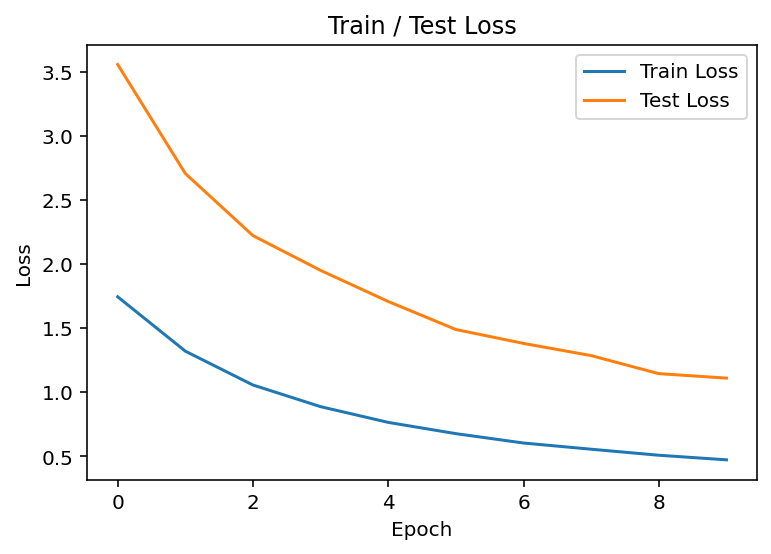

In [31]:
# Plot the losses over epochs
plt.figure()
plt.plot(train_losses, label = 'Train Loss')
plt.plot(test_losses, label = 'Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title("Train / Test Loss")
plt.show()

# Model evalutation & results

**RNN Single-Note Generation Evaluation**

In [32]:
def evaluate(net, prime_seq, predict_len):
    '''
    Arguments:
    prime_seq - priming sequence (converted t)
    predict_len - number of notes to predict for after prime sequence
    '''
    hidden = net.init_hidden()

    predicted = prime_seq.copy()
    prime_seq = torch.tensor(prime_seq, dtype = torch.long).to(device)


    # "Building up" the hidden state using the prime sequence
    for p in range(len(prime_seq) - 1):
        input = prime_seq[p]
        _, hidden = net(input, hidden)
    
    # Last character of prime sequence
    input = prime_seq[-1]
    
    # For every index to predict
    for p in range(predict_len):

        # Pass the inputs to the model - output has dimension n_pitches - scores for each of the possible characters
        output, hidden = net(input, hidden)

        # Pick the character with the highest probability 
        predicted_id = torch.argmax(torch.softmax(output, dim = 1))

        # Add predicted index to the list and use as next input
        predicted.append(predicted_id.item()) 
        input = predicted_id

    return predicted

def evaluateMultinomial(net, prime_seq, predict_len, temperature=0.8):
    '''
    Arguments:
    prime_seq - priming sequence (converted t)
    predict_len - number of notes to predict for after prime sequence
    '''
    hidden = net.init_hidden()

    predicted = prime_seq.copy()
    prime_seq = torch.tensor(prime_seq, dtype = torch.long).to(device)


    # "Building up" the hidden state using the prime sequence
    for p in range(len(prime_seq) - 1):
        input = prime_seq[p]
        _, hidden = net(input, hidden)
    
    # Last character of prime sequence
    input = prime_seq[-1]
    
    # For every index to predict
    for p in range(predict_len):

        # Pass the inputs to the model - output has dimension n_pitches - scores for each of the possible characters
        output, hidden = net(input, hidden)
        # Sample from the network output as a multinomial distribution
        output = output.data.view(-1).div(temperature).exp()
        predicted_id = torch.multinomial(output, 1)

        # Add predicted index to the list and use as next input
        predicted.append(predicted_id.item()) 
        input = predicted_id

    return predicted

In [33]:
generated_seq = evaluate(model, [100, 101, 102, 101, 100], predict_len = 100)
generated_seq_multinomial = evaluateMultinomial(model, [100, 101, 102, 101, 100], predict_len = 500, temperature = 1.2)
print(generated_seq)
print(generated_seq_multinomial)

[100, 101, 102, 101, 100, 101, 391, 398, 258, 172, 389, 423, 340, 168, 423, 389, 15, 171, 15, 171, 406, 398, 423, 171, 406, 405, 423, 171, 406, 398, 423, 406, 405, 423, 420, 406, 398, 423, 406, 398, 423, 406, 405, 423, 241, 420, 418, 423, 418, 398, 423, 418, 398, 423, 418, 398, 423, 418, 52, 423, 418, 423, 418, 398, 423, 418, 52, 423, 418, 398, 423, 418, 52, 423, 418, 398, 423, 390, 420, 418, 423, 418, 398, 423, 418, 52, 423, 418, 398, 423, 418, 52, 423, 418, 398, 423, 418, 52, 423, 418, 398, 423, 418, 52, 423]
[100, 101, 102, 101, 100, 135, 411, 189, 267, 392, 431, 328, 241, 384, 268, 267, 331, 268, 75, 384, 85, 267, 331, 268, 75, 233, 384, 85, 142, 384, 267, 331, 268, 411, 407, 431, 179, 425, 431, 219, 406, 407, 431, 331, 268, 75, 384, 85, 267, 331, 268, 233, 331, 268, 263, 75, 233, 384, 85, 408, 268, 142, 354, 75, 384, 85, 267, 331, 268, 263, 75, 331, 268, 75, 233, 331, 268, 75, 384, 85, 267, 331, 268, 263, 75, 384, 85, 267, 331, 268, 75, 233, 384, 85, 278, 331, 268, 75, 233, 384, 8

**Converting Generated Sequences Into MIDI/Audio**

In [34]:
# Convert the generated ints into notes
generated_seq = [int_to_note[e] for e in generated_seq]
generated_seq_multinomial = [int_to_note[e] for e in generated_seq_multinomial]

In [35]:
def create_midi(prediction_output):
    """ convert the output from the prediction to notes and create a midi file
        from the notes """
    offset = 0
    output_notes = []

    # create note and chord objects based on the values generated by the model
    for pattern in prediction_output:
        # pattern is a chord
        if ('.' in pattern) or pattern.isdigit():
            notes_in_chord = pattern.split('.')
            notes = []
            for current_note in notes_in_chord:
                new_note = note.Note(int(current_note))
                new_note.storedInstrument = instrument.Piano()
                notes.append(new_note)
            new_chord = chord.Chord(notes)
            new_chord.offset = offset
            output_notes.append(new_chord)
        # pattern is a note
        else:
            new_note = note.Note(pattern)
            new_note.offset = offset
            new_note.storedInstrument = instrument.Piano()
            output_notes.append(new_note)

        # increase offset each iteration so that notes do not stack
        offset += 0.5

    midi_stream = stream.Stream(output_notes)

    return midi_stream

In [37]:
pred_midi = create_midi(generated_seq)
pred_midi_multinomial = create_midi(generated_seq_multinomial)

In [42]:
pred_midi.write('midi', fp='/content/pred_midi.mid')
pred_midi_multinomial.write('midi', fp='/content/pred_midi_multinomial.mid')

'/content/pred_midi_multinomial.mid'

In [43]:
# Load the generated MIDI
generated_multitrack = pypianoroll.read('/content/pred_midi.mid')
generated_pm = pypianoroll.to_pretty_midi(generated_multitrack)
generated_midi_audio = generated_pm.fluidsynth()
IPython.display.Audio(generated_midi_audio, rate = 44100)

In [44]:
# Load the generated MIDI
generated_multitrack = pypianoroll.read('/content/pred_midi_multinomial.mid')
generated_pm = pypianoroll.to_pretty_midi(generated_multitrack)
generated_midi_audio = generated_pm.fluidsynth()
IPython.display.Audio(generated_midi_audio, rate = 44100)